In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from os.path import join
import scanpy as sc
import ast
import anndata
import seaborn as sns
import gc
import pickle
from pathlib import Path
from abc_atlas_access.abc_atlas_cache.abc_project_cache import AbcProjectCache
import warnings

In [3]:
saving_dir = '/mnt/Y/Lab/Stereo_seq_data/RL_BG_data/analysis_results/panels/cell_spatial'

# Plot parcellations

In [6]:
# Load saved MERFISH data
download_base = Path('/mnt/Y/Lab/Stereo_seq_data/RL_BG_data/raw_data')
abc_cache = AbcProjectCache.from_cache_dir(download_base)

abc_cache.current_manifest

'releases/20250531/manifest.json'

In [7]:
# load merfish data
file_path = abc_cache.get_data_path(directory='MERFISH-C57BL6J-638850', file_name='C57BL6J-638850/log2')
mf_adata = sc.read_h5ad(file_path)
mf_adata

AnnData object with n_obs × n_vars = 4334174 × 550
    obs: 'brain_section_label'
    var: 'gene_symbol', 'transcript_identifier'
    uns: 'accessed_on', 'src'

In [8]:
# cell meta data (ccf registered)
cell_meta = abc_cache.get_metadata_dataframe(
    directory='MERFISH-C57BL6J-638850-CCF',
    file_name='cell_metadata_with_parcellation_annotation',
    index_col='cell_label',
    dtype={'cell_label': str}
)
print(len(cell_meta))
cell_meta

3739961


,brain_section_label,cluster_alias,average_correlation_score,feature_matrix_label,donor_label,donor_genotype,donor_sex,x_section,y_section,z_section,...,parcellation_organ,parcellation_category,parcellation_division,parcellation_structure,parcellation_substructure,parcellation_organ_color,parcellation_category_color,parcellation_division_color,parcellation_structure_color,parcellation_substructure_color
cell_label,,,,,,,,,,,,,,,,,,,,,
1019171907102340387-1,C57BL6J-638850.37,1408,0.596276,C57BL6J-638850,C57BL6J-638850,wt/wt,M,7.226245,4.148963,6.6,...,brain,grey,HPF,DG,DG-po,#FFFFFF,#BFDAE3,#7ED04B,#7ED04B,#7ED04B
1104095349101460194-1,C57BL6J-638850.26,4218,0.641180,C57BL6J-638850,C57BL6J-638850,wt/wt,M,5.064889,7.309543,4.2,...,brain,grey,P,TRN,TRN,#FFFFFF,#BFDAE3,#FF9B88,#FFBA86,#FFBA86
1017092617101450577,C57BL6J-638850.25,4218,0.763531,C57BL6J-638850,C57BL6J-638850,wt/wt,M,5.792921,8.189973,4.0,...,brain,grey,P,P-unassigned,P-unassigned,#FFFFFF,#BFDAE3,#FF9B88,#FF9B88,#FF9B88
1018093344101130233,C57BL6J-638850.13,4218,0.558073,C57BL6J-638850,C57BL6J-638850,wt/wt,M,3.195950,5.868655,2.4,...,brain,fiber tracts,cbf,arb,arb,#FFFFFF,#CCCCCC,#CCCCCC,#CCCCCC,#CCCCCC
1019171912201610094,C57BL6J-638850.27,4218,0.591009,C57BL6J-638850,C57BL6J-638850,wt/wt,M,5.635732,7.995842,4.4,...,brain,grey,P,P-unassigned,P-unassigned,#FFFFFF,#BFDAE3,#FF9B88,#FF9B88,#FF9B88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018093344100380167-3,C57BL6J-638850.47,5252,0.574988,C57BL6J-638850,C57BL6J-638850,wt/wt,M,1.560003,4.669243,8.8,...,brain,grey,Isocortex,SSp-n,SSp-n2/3,#FFFFFF,#BFDAE3,#70FF71,#188064,#188064
1017165415100930567,C57BL6J-638850.57,5254,0.620546,C57BL6J-638850,C57BL6J-638850,wt/wt,M,5.032556,3.695696,11.0,...,brain,grey,Isocortex,ACAd,ACAd5,#FFFFFF,#BFDAE3,#70FF71,#40A666,#40A666
1017155956102610748,C57BL6J-638850.49,5254,0.548053,C57BL6J-638850,C57BL6J-638850,wt/wt,M,2.549142,4.231188,9.2,...,brain,grey,Isocortex,SSp-m,SSp-m6a,#FFFFFF,#BFDAE3,#70FF71,#188064,#188064


In [9]:
# get intersected indexes
valid_index = mf_adata.obs.index.intersection(cell_meta.index)
mf_adata = mf_adata[valid_index].copy()
mf_adata

AnnData object with n_obs × n_vars = 3739961 × 550
    obs: 'brain_section_label'
    var: 'gene_symbol', 'transcript_identifier'
    uns: 'accessed_on', 'src'

In [10]:
# add cell meta to adata (reoder the adata indexes)
mf_adata.obs = cell_meta.loc[mf_adata.obs.index].copy()
mf_adata

AnnData object with n_obs × n_vars = 3739961 × 550
    obs: 'brain_section_label', 'cluster_alias', 'average_correlation_score', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'x_section', 'y_section', 'z_section', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'x_reconstructed', 'y_reconstructed', 'z_reconstructed', 'parcellation_index', 'x_ccf', 'y_ccf', 'z_ccf', 'parcellation_organ', 'parcellation_category', 'parcellation_division', 'parcellation_structure', 'parcellation_substructure', 'parcellation_organ_color', 'parcellation_category_color', 'parcellation_division_color', 'parcellation_structure_color', 'parcellation_substructure_color'
    var: 'gene_symbol', 'transcript_identifier'
    uns: 'accessed_on', 'src'

In [11]:
# add coordinates to obsm.spatial
mf_adata.obsm['spatial'] = mf_adata.obs[['x_section', 'y_section', 'z_section']].copy().to_numpy()
mf_adata

AnnData object with n_obs × n_vars = 3739961 × 550
    obs: 'brain_section_label', 'cluster_alias', 'average_correlation_score', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'x_section', 'y_section', 'z_section', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'x_reconstructed', 'y_reconstructed', 'z_reconstructed', 'parcellation_index', 'x_ccf', 'y_ccf', 'z_ccf', 'parcellation_organ', 'parcellation_category', 'parcellation_division', 'parcellation_structure', 'parcellation_substructure', 'parcellation_organ_color', 'parcellation_category_color', 'parcellation_division_color', 'parcellation_structure_color', 'parcellation_substructure_color'
    var: 'gene_symbol', 'transcript_identifier'
    uns: 'accessed_on', 'src'
    obsm: 'spatial'

In [12]:
from utils import set_color_palettes
set_color_palettes(mf_adata, do_parcellation=True)
mf_adata

AnnData object with n_obs × n_vars = 3739961 × 550
    obs: 'brain_section_label', 'cluster_alias', 'average_correlation_score', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'x_section', 'y_section', 'z_section', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'x_reconstructed', 'y_reconstructed', 'z_reconstructed', 'parcellation_index', 'x_ccf', 'y_ccf', 'z_ccf', 'parcellation_organ', 'parcellation_category', 'parcellation_division', 'parcellation_structure', 'parcellation_substructure', 'parcellation_organ_color', 'parcellation_category_color', 'parcellation_division_color', 'parcellation_structure_color', 'parcellation_substructure_color'
    var: 'gene_symbol', 'transcript_identifier'
    uns: 'accessed_on', 'src', 'neurotransmitter_palette', 'class_palette', 'subclass_palette', 'supertype_palette', 'cluster_palette', 'parcellation_organ_palette',

In [30]:
warnings.filterwarnings('ignore')
sec = 50
section_label = 'C57BL6J-638850.{}'.format(sec)

with plt.rc_context({'figure.figsize':(15, 8), 'figure.dpi':300}):
    mf_sec_adata = mf_adata[mf_adata.obs['brain_section_label'] == section_label]

    sc.pl.spatial(mf_sec_adata, color='parcellation_structure',
                  palette = mf_sec_adata.uns['parcellation_structure_palette'],
                  spot_size=0.025, title='', legend_fontsize=12, frameon=False, show=False)

    plt.savefig(join(saving_dir, 'sec50', 'region_spatial.tif'), format='tif', bbox_inches='tight')


# Load saved MERFISH data

In [2]:
save_dir = '/mnt/Y/Lab/Stereo_seq_data/RL_BG_data/analysis_results'
with open(join(save_dir, 'WMB_BG_mf_sec50_20251005.pkl'), 'rb') as f:
    sec50_adata = pickle.load(f)

with open(join(save_dir, 'WMB_BG_mf_sec49_20251005.pkl'), 'rb') as f:
    sec49_adata = pickle.load(f)

with open(join(save_dir, 'WMB_BG_mf_sec46_20251005.pkl'), 'rb') as f:
    sec46_adata = pickle.load(f)

In [4]:
sec50_adata

AnnData object with n_obs × n_vars = 44848 × 550
    obs: 'brain_section_label', 'cluster_alias', 'average_correlation_score', 'feature_matrix_label', 'donor_label', 'donor_genotype', 'donor_sex', 'x_section', 'y_section', 'z_section', 'neurotransmitter', 'class', 'subclass', 'supertype', 'cluster', 'neurotransmitter_color', 'class_color', 'subclass_color', 'supertype_color', 'cluster_color', 'x_reconstructed', 'y_reconstructed', 'z_reconstructed', 'parcellation_index', 'x_ccf', 'y_ccf', 'z_ccf', 'parcellation_organ', 'parcellation_category', 'parcellation_division', 'parcellation_structure', 'parcellation_substructure', 'parcellation_organ_color', 'parcellation_category_color', 'parcellation_division_color', 'parcellation_structure_color', 'parcellation_substructure_color'
    var: 'gene_symbol', 'transcript_identifier'
    uns: 'accessed_on', 'src', 'neurotransmitter_palette', 'class_palette', 'subclass_palette', 'supertype_palette', 'cluster_palette', 'parcellation_organ_palette', '

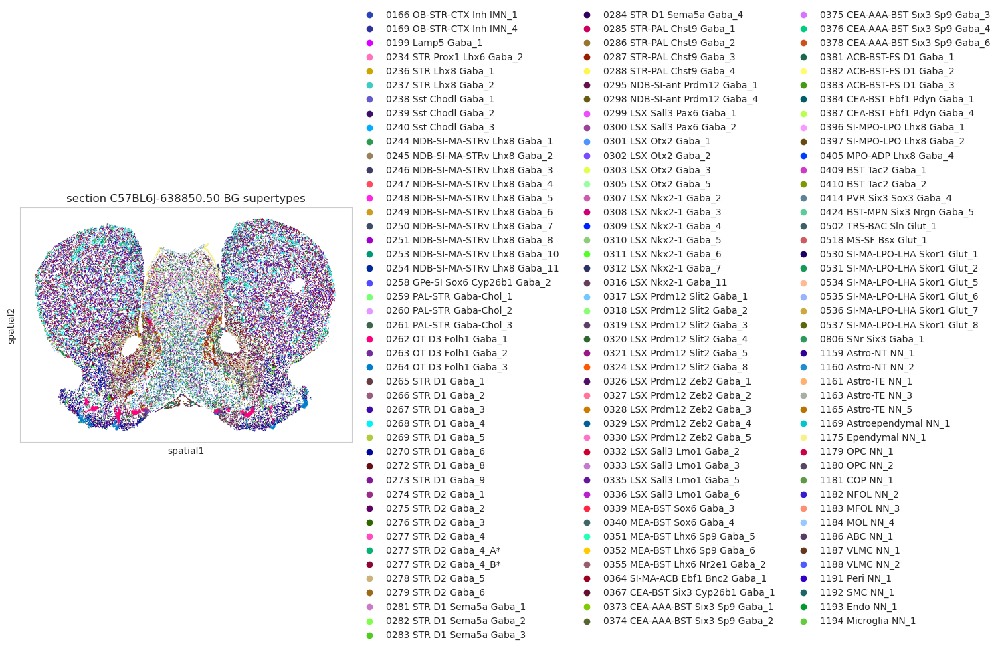

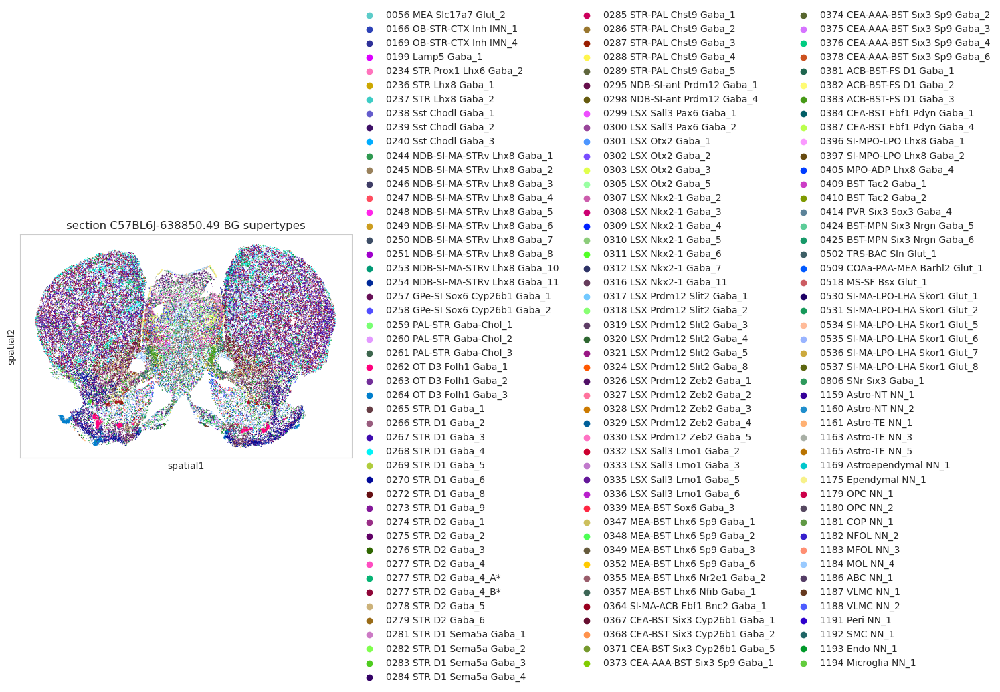

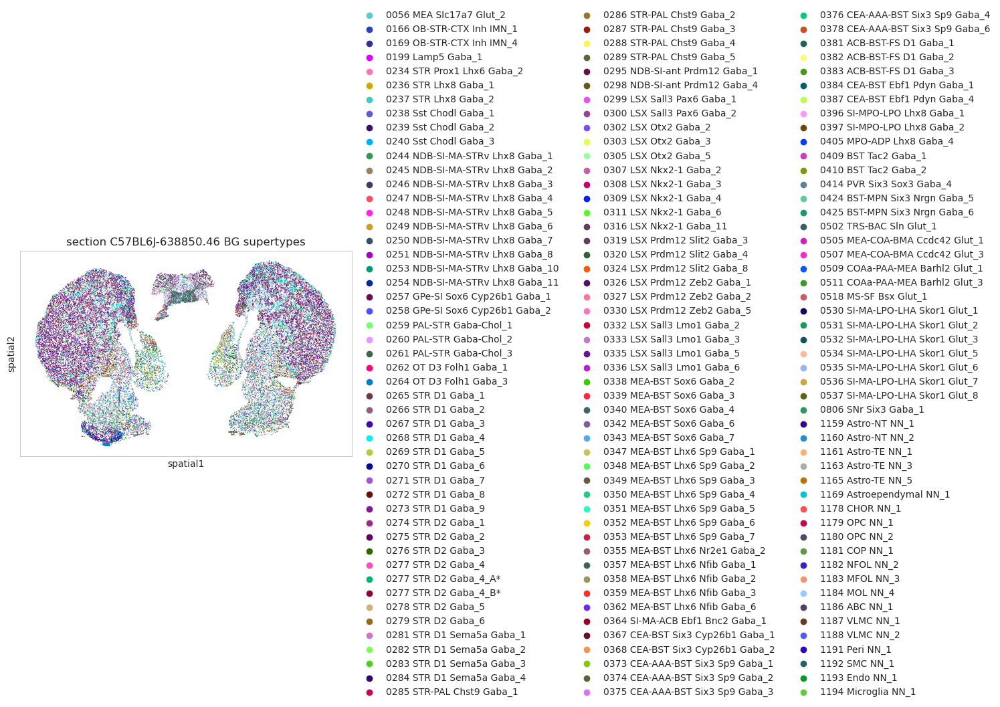

In [19]:
warnings.filterwarnings('ignore')

sc.pl.spatial(sec50_adata, color='supertype', spot_size=0.02, palette=sec50_adata.uns['supertype_palette'], title=['section C57BL6J-638850.50 BG supertypes'])
sc.pl.spatial(sec49_adata, color='supertype', spot_size=0.02, palette=sec49_adata.uns['supertype_palette'], title=['section C57BL6J-638850.49 BG supertypes'])
sc.pl.spatial(sec46_adata, color='supertype', spot_size=0.02, palette=sec46_adata.uns['supertype_palette'], title=['section C57BL6J-638850.46 BG supertypes'])

# Cell type list

In [20]:
# wmb supertype list
stype_list = [
    ###
    '0262 OT D3 Folh1 Gaba_1', '0263 OT D3 Folh1 Gaba_2',
    '0264 OT D3 Folh1 Gaba_3',
    ###
    '0265 STR D1 Gaba_1', '0266 STR D1 Gaba_2',
    '0267 STR D1 Gaba_3', '0268 STR D1 Gaba_4',
    '0269 STR D1 Gaba_5', '0270 STR D1 Gaba_6',
    '0271 STR D1 Gaba_7', '0272 STR D1 Gaba_8',
    ###
    '0274 STR D2 Gaba_1', '0275 STR D2 Gaba_2',
    '0276 STR D2 Gaba_3', '0277 STR D2 Gaba_4_A*', '0277 STR D2 Gaba_4_B*',
    '0278 STR D2 Gaba_5', '0279 STR D2 Gaba_6',
    ###
    '0281 STR D1 Sema5a Gaba_1', '0282 STR D1 Sema5a Gaba_2',
    '0283 STR D1 Sema5a Gaba_3', '0284 STR D1 Sema5a Gaba_4',
    ###
    '0285 STR-PAL Chst9 Gaba_1', '0286 STR-PAL Chst9 Gaba_2',
    '0287 STR-PAL Chst9 Gaba_3', '0288 STR-PAL Chst9 Gaba_4',
    '0288 STR-PAL Chst9 Gaba_4', '0289 STR-PAL Chst9 Gaba_5'
]

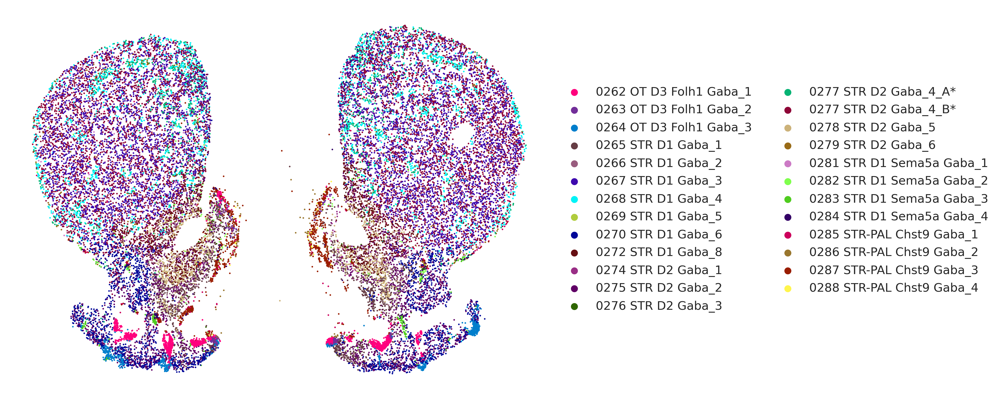

In [22]:
with plt.rc_context({'figure.figsize':(15, 7), 'figure.dpi':300}):
    sc.pl.spatial(sec50_adata[sec50_adata.obs['supertype'].isin(stype_list)],
                  color='supertype', palette=sec50_adata.uns['supertype_palette'],
                  spot_size=0.02, frameon=False, title='', legend_fontsize=12, show=False)
    plt.savefig(join(saving_dir, 'sec50', 'Drd_cells_spatial.tif'), format='tif', bbox_inches='tight')

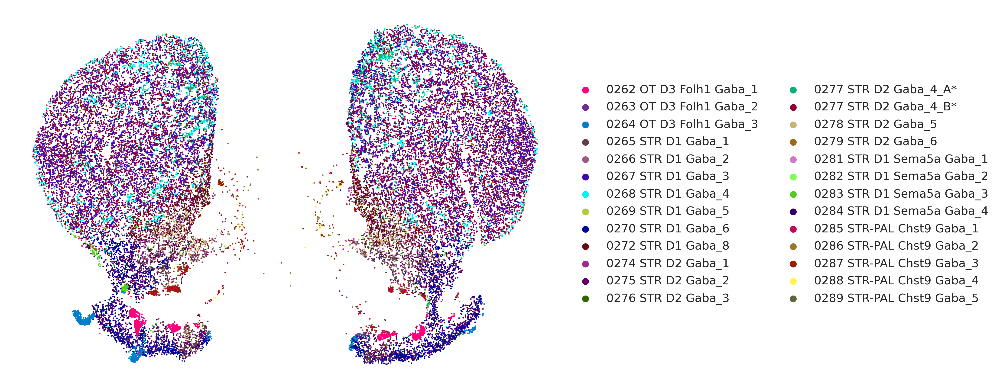

In [23]:
with plt.rc_context({'figure.figsize':(15, 7), 'figure.dpi':300}):
    sc.pl.spatial(sec49_adata[sec49_adata.obs['supertype'].isin(stype_list)],
                  color='supertype', palette=sec49_adata.uns['supertype_palette'],
                  spot_size=0.02, frameon=False, title='', legend_fontsize=12, show=False)
    plt.savefig(join(saving_dir, 'sec49', 'Drd_cells_spatial.tif'), format='tif', bbox_inches='tight')

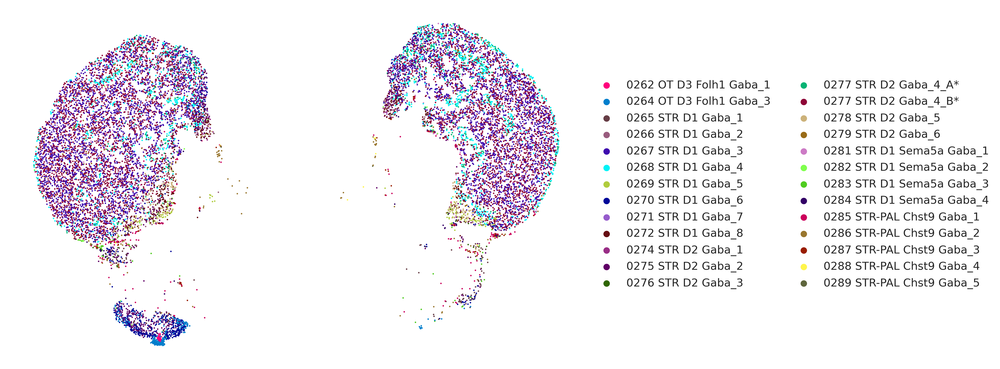

In [24]:
with plt.rc_context({'figure.figsize':(15, 7), 'figure.dpi':300}):
    sc.pl.spatial(sec46_adata[sec46_adata.obs['supertype'].isin(stype_list)],
                  color='supertype', palette=sec46_adata.uns['supertype_palette'],
                  spot_size=0.02, frameon=False, title='', legend_fontsize=12, show=False)
    plt.savefig(join(saving_dir, 'sec46', 'Drd_cells_spatial.tif'), format='tif', bbox_inches='tight')

# Cell type spatial distribution

In [62]:
def plot_cell_spatial(cell_type, color=None, focus_degree=2, show=True, saving_name=None, saving_dir ='/mnt/Y/Lab/Stereo_seq_data/RL_BG_data/analysis_results/panels/cell_spatial'):
    for sec, adata in zip(['sec50', 'sec49', 'sec46'], [sec50_adata, sec49_adata, sec46_adata]):
        fig, ax = plt.subplots(figsize=(12.5, 9), dpi=300)
        dot_size=0.2

        # subsec to drd cells
        adata = adata[adata.obs['supertype'].isin(stype_list)]

        # (n_cells, 3)
        coords = adata.obsm['spatial']

        # plot all cells
        ax.scatter(x=coords[:, 0], y=coords[:,1], s=dot_size, c='0.6')

        # plot ctype cells
        mask = (adata.obs['supertype'] == cell_type)
        if color:
            c = color
        else:
            c = adata.uns['supertype_palette'][cell_type]

        # draw
        ax.scatter(x=coords[mask, 0], y=coords[mask, 1], s=dot_size*focus_degree, c=c)

        ax.grid(False)
        ax.axis("off")

        ax.invert_yaxis()
        ax.set_title('{} cell type [{}] spatial distribution'.format(sec, cell_type), fontsize=14)

        if saving_name:
            plt.savefig(join(saving_dir, sec, saving_name), format='tif', bbox_inches='tight')
        if show:
            plt.show()
        else:
            plt.close()

In [60]:
stype_list = [
    ###
    '0262 OT D3 Folh1 Gaba_1', '0263 OT D3 Folh1 Gaba_2',
    '0264 OT D3 Folh1 Gaba_3',
    ###
    '0265 STR D1 Gaba_1', '0266 STR D1 Gaba_2',
    '0267 STR D1 Gaba_3', '0268 STR D1 Gaba_4',
    '0269 STR D1 Gaba_5', '0270 STR D1 Gaba_6',
    '0271 STR D1 Gaba_7', '0272 STR D1 Gaba_8',
    ###
    '0274 STR D2 Gaba_1', '0275 STR D2 Gaba_2',
    '0276 STR D2 Gaba_3', '0277 STR D2 Gaba_4_A*', '0277 STR D2 Gaba_4_B*',
    '0278 STR D2 Gaba_5', '0279 STR D2 Gaba_6',
    ###
    '0281 STR D1 Sema5a Gaba_1', '0282 STR D1 Sema5a Gaba_2',
    '0283 STR D1 Sema5a Gaba_3', '0284 STR D1 Sema5a Gaba_4',
    ###
    '0285 STR-PAL Chst9 Gaba_1', '0286 STR-PAL Chst9 Gaba_2',
    '0287 STR-PAL Chst9 Gaba_3', '0288 STR-PAL Chst9 Gaba_4',
    '0288 STR-PAL Chst9 Gaba_4', '0289 STR-PAL Chst9 Gaba_5'
]

# figure names
temp_stype_list = [
    ###
    '0262_OT_D3_Folh1_Gaba_1', '0263_OT_D3_Folh1_Gaba_2',
    '0264_OT_D3_Folh1_Gaba_3',
    ###
    '0265_STR_D1_Gaba_1', '0266_STR_D1_Gaba_2',
    '0267_STR_D1_Gaba_3', '0268_STR_D1_Gaba_4',
    '0269_STR_D1_Gaba_5', '0270_STR_D1_Gaba_6',
    '0271_STR_D1_Gaba_7', '0272_STR_D1_Gaba_8',
    ###
    '0274_STR_D2_Gaba_1', '0275_STR_D2_Gaba_2',
    '0276_STR_D2_Gaba_3', '0277_STR_D2_Gaba_4_A*', '0277_STR_D2_Gaba_4_B*',
    '0278_STR_D2_Gaba_5', '0279_STR_D2_Gaba_6',
    ###
    '0281_STR_D1_Sema5a_Gaba_1', '0282_STR_D1_Sema5a_Gaba_2',
    '0283_STR_D1_Sema5a_Gaba_3', '0284_STR_D1_Sema5a_Gaba_4',
    ###
    '0285_STR_PAL_Chst9_Gaba_1', '0286_STR_PAL_Chst9_Gaba_2',
    '0287_STR_PAL_Chst9_Gaba_3', '0288_STR_PAL_Chst9_Gaba_4',
    '0288_STR_PAL_Chst9_Gaba_4', '0289_STR_PAL_Chst9_Gaba_5'
]

In [69]:
for t1, t2 in zip(stype_list, temp_stype_list):
    plot_cell_spatial(t1, saving_name='spatial_{}.tif'.format(t2), focus_degree=8, show=False)

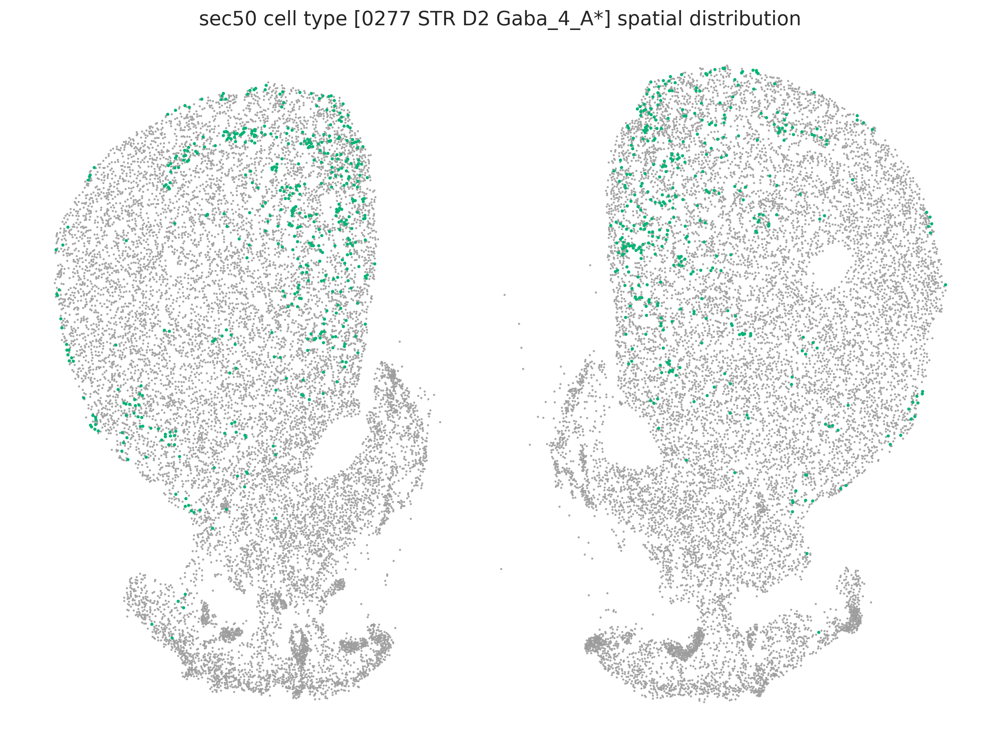

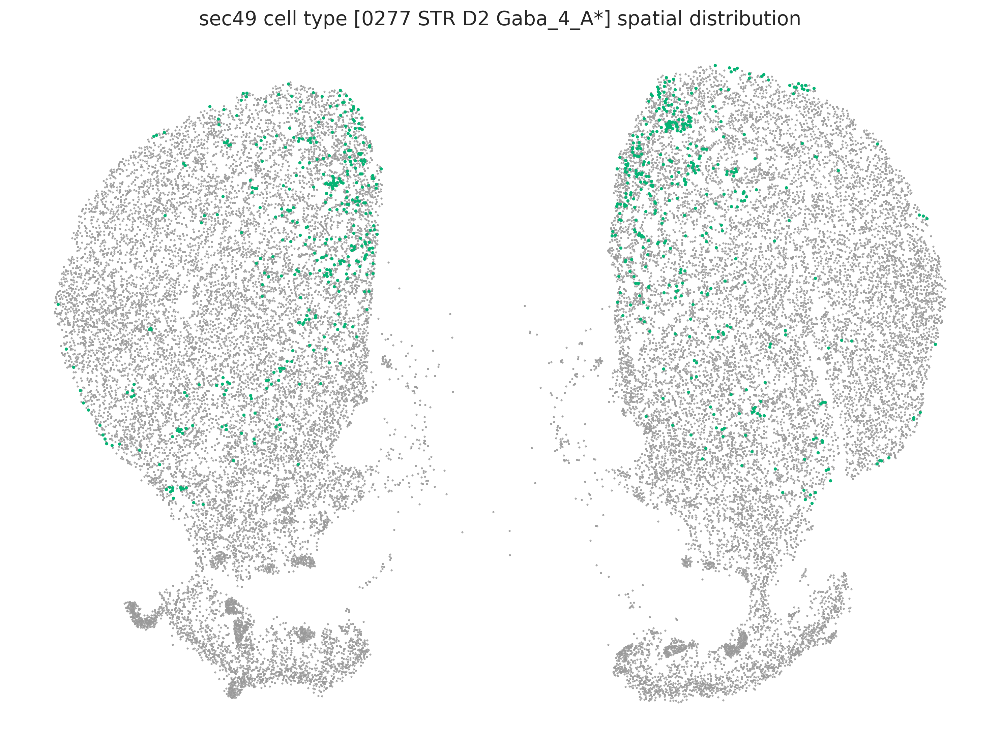

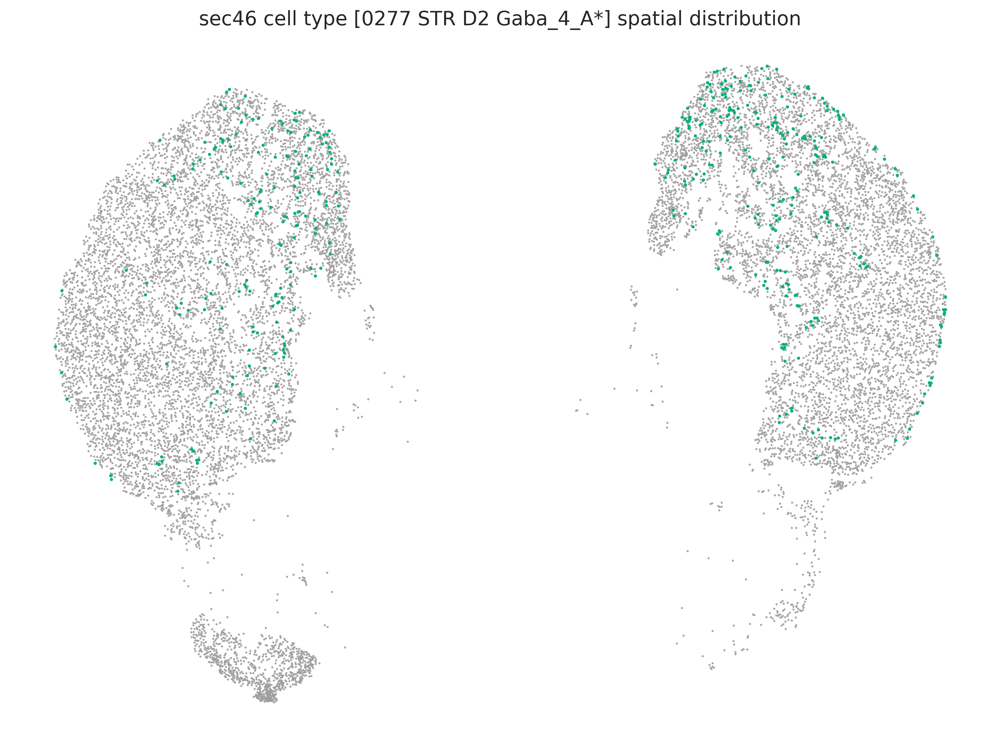

In [68]:
plot_cell_spatial('0277 STR D2 Gaba_4_A*', focus_degree=8)

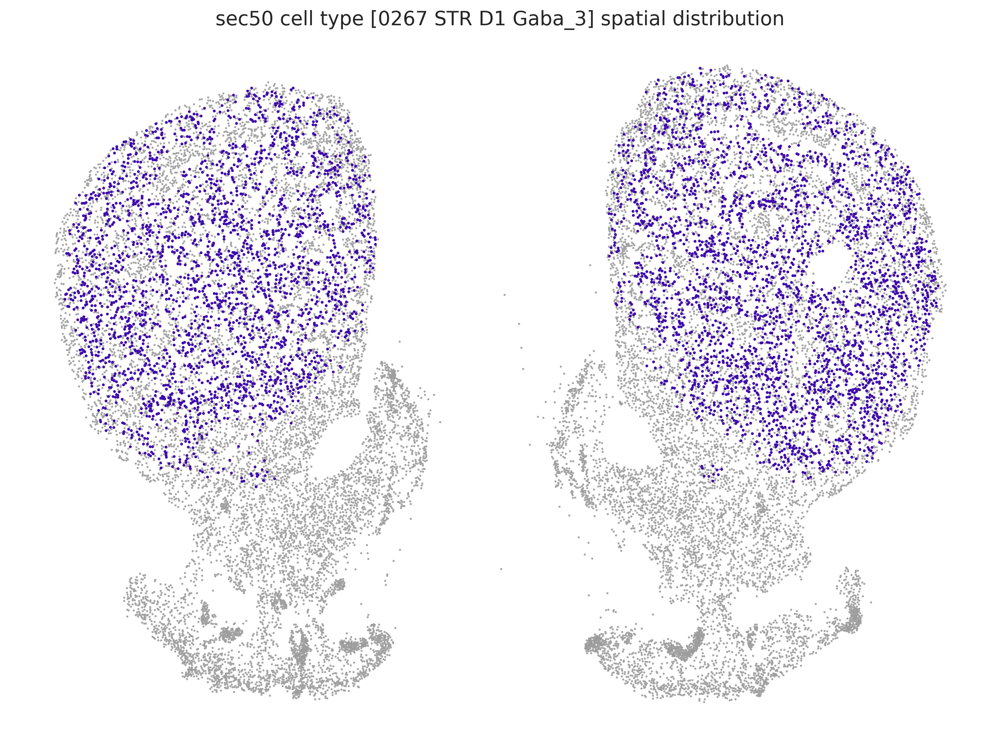

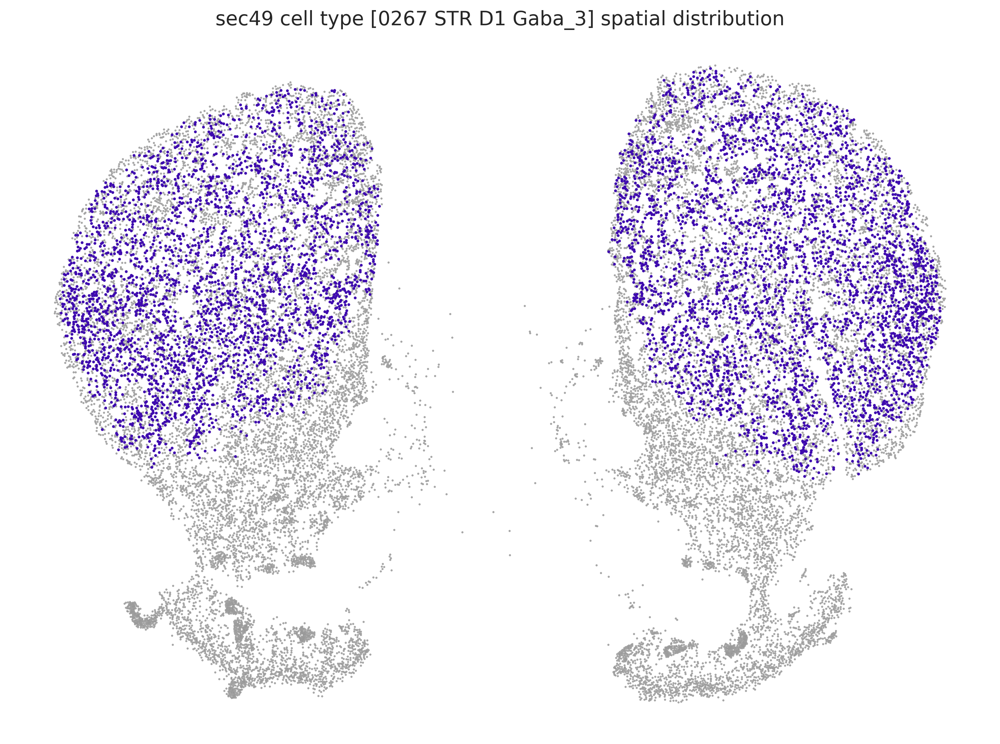

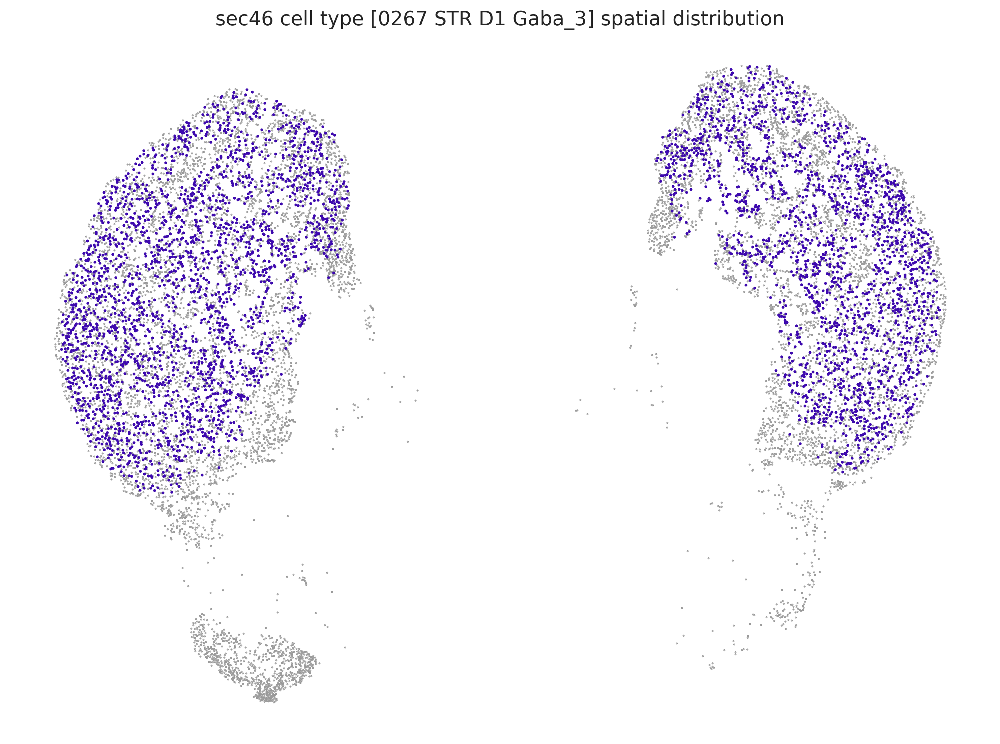

In [65]:
plot_cell_spatial('0267 STR D1 Gaba_3', focus_degree=5)